# Extinction Color Examination


Analysis of extinction colors.

Used to be just for the narrowbands, but expanded to broadbands when I got them

In [181]:
%matplotlib inline

In [182]:
basepath = '/orange/adamginsburg/jwst/brick/'

In [183]:
cd $basepath

/blue/adamginsburg/adamginsburg/jwst/brick


In [184]:
import sys
if '' in sys.path:
    sys.path.remove('')

In [185]:
%run $basepath/analysis/analysis_setup.py

Set DATE-AVG to '2022-08-28T03:05:32.473' from MJD-AVG.
Set DATE-END to '2022-08-28T03:34:03.557' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -20.661125 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526408297.850 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2024-06-29 07:19:49
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2024-06-29 23:27:00


<Figure size 640x480 with 0 Axes>

In [186]:
%run $basepath/analysis/selections.py --module=merged1182_daophot_basic_bgsub_blur

Selecting module merged1182_daophot_basic_bgsub_blur

merged1182_daophot_basic_bgsub_blur
Selecting based on filters ['f410m', 'f212n', 'f466n', 'f405n', 'f187n', 'f182m', 'f444w', 'f356w', 'f200w', 'f115w']
1466 saturated in near_saturated_f212n_f212n
114 saturated in near_saturated_f466n_f466n
938 saturated in near_saturated_f405n_f405n
657 saturated in near_saturated_f187n_f187n
10719 saturated in near_saturated_f182m_f182m
25353 saturated in near_saturated_f444w_f444w
28364 saturated in near_saturated_f356w_f356w
36060 saturated in near_saturated_f200w_f200w
1747 saturated in near_saturated_f115w_f115w
62978 near saturated out of 1553496.  That leaves 1490518 not near unsaturated
1466 saturated in near_saturated_f212n_f212n
114 saturated in near_saturated_f466n_f466n
938 saturated in near_saturated_f405n_f405n
657 saturated in near_saturated_f187n_f187n
10719 saturated in near_saturated_f182m_f182m
16668 near saturated out of 1553496.  That leaves 1536828 not near unsaturated
62 sa

In [187]:
def extinction_contour_plot(minext, maxext, extcolor=extcolor,
                            sel=None,
                            bgfn=f'{basepath}/images/BrickJWST_merged_longwave_narrowband_lighter.png'):
    avm = pyavm.AVM.from_image(bgfn)
    img_narrow = np.array(PIL.Image.open(bgfn))[::-1,:,:]
    wwi_narrow = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

    #img_narrow = img_narrow.swapaxes(0,1)
    wwi_narrow = wwi_narrow.sub([2,1])

    fig = pl.figure(figsize=(12,4))
    ax = pl.subplot(projection=wwi_narrow)
    ax.imshow(img_narrow)

    if sel is None:
        sel = np.ones(len(basetable), dtype='bool')

    s1 = (extcolor>minext) & (extcolor<maxext) & sel
    crds = basetable['skycoord_ref']
    
    print(f'Matched {s1.sum()}')
    xx = np.linspace(crds.ra.min(), crds.ra.max(), 25).value
    yy = np.linspace(crds.dec.min(), crds.dec.max(), 25).value
    zz, xe, ye = np.histogram2d(crds[s1].ra.value, crds[s1].dec.value, bins=[xx, yy])
    cx = (xx[1:]+xx[:-1])/2
    cy = (yy[1:]+yy[:-1])/2
    pl.contour(cy, cx, zz, transform=ax.get_transform('world'));
    pl.colorbar();
    pl.title(f"Extinction color {minext} to {maxext} mag");

# Extinction Measurements

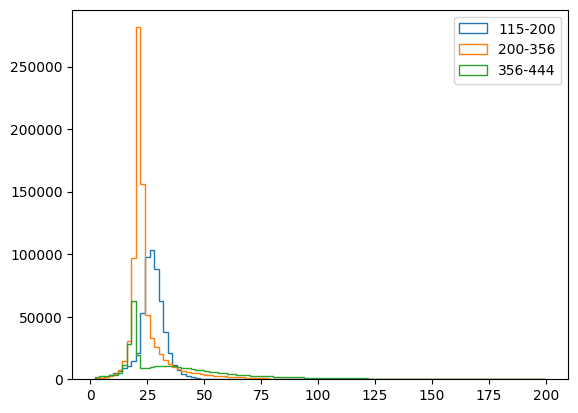

In [240]:
pl.hist(av115200[~magerr_gtpt05], histtype='step', bins=np.linspace(2,200,100), label='115-200')
pl.hist(av200356[~magerr_gtpt05], histtype='step', bins=np.linspace(2,200,100), label='200-356')
pl.hist(av356444[~magerr_gtpt05], histtype='step', bins=np.linspace(2,200,100), label='356-444')

pl.legend(loc='best');

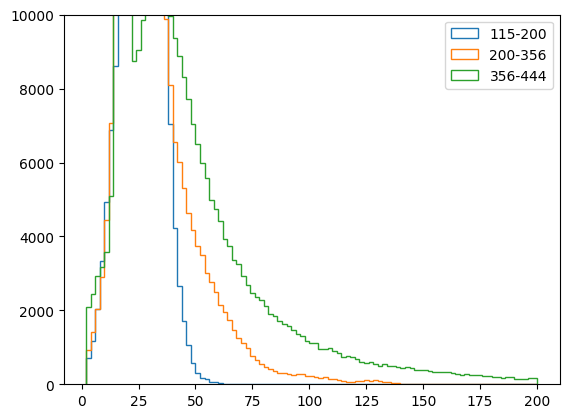

In [239]:
pl.hist(av115200[~magerr_gtpt05], histtype='step', bins=np.linspace(2,200,100), label='115-200')
pl.hist(av200356[~magerr_gtpt05], histtype='step', bins=np.linspace(2,200,100), label='200-356')
pl.hist(av356444[~magerr_gtpt05], histtype='step', bins=np.linspace(2,200,100), label='356-444')

pl.ylim(0,10000)
pl.legend(loc='best');

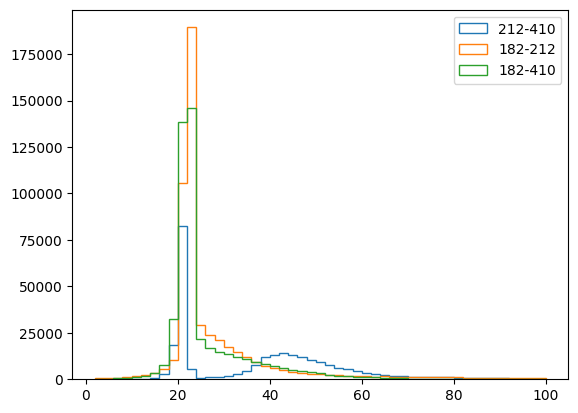

In [216]:
pl.hist(av212410[~magerr_gtpt05], histtype='step', bins=np.linspace(2,100), label='212-410')
pl.hist(av182212[~magerr_gtpt05], histtype='step', bins=np.linspace(2,100), label='182-212')
pl.hist(av182410[~magerr_gtpt05], histtype='step', bins=np.linspace(2,100), label='182-410')

pl.legend(loc='best');

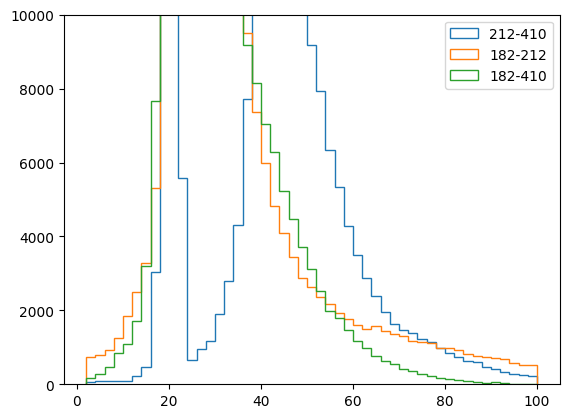

In [218]:
pl.hist(av212410[~magerr_gtpt05], histtype='step', bins=np.linspace(2,100), label='212-410')
pl.hist(av182212[~magerr_gtpt05], histtype='step', bins=np.linspace(2,100), label='182-212')
pl.hist(av182410[~magerr_gtpt05], histtype='step', bins=np.linspace(2,100), label='182-410')

pl.ylim(0,10000)
pl.legend(loc='best');

### Conclusions from above:

There is a large sample of stars with A_V ~ 20, they must represent the bulge-ish foreground component.

Something is likely broken in 212-410 A_V

## Check whether different A_Vs agree

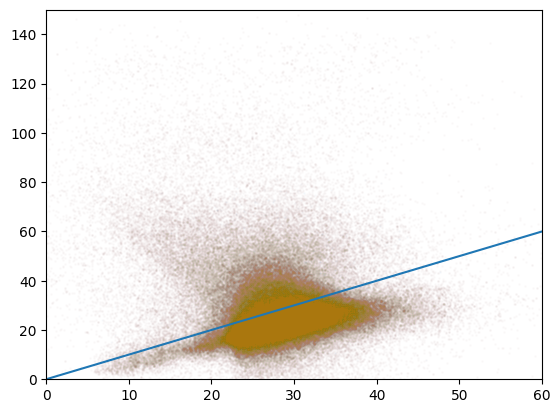

In [230]:
pl.scatter(av115200, av200356, alpha=0.01, s=1);
pl.scatter(av115200[~magerr_gtpt05], av200356[~magerr_gtpt05], alpha=0.01, s=1);
pl.plot([0,100],[0,100]);
pl.axis([0,60,0,150]);

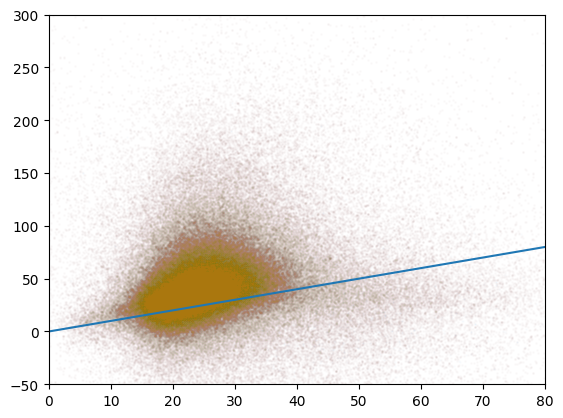

In [229]:
pl.scatter(av200356, av356444, alpha=0.01, s=1);
pl.scatter(av200356[~magerr_gtpt05], av356444[~magerr_gtpt05], alpha=0.01, s=1);
pl.plot([0,100],[0,100]);
pl.axis([0,80,-50,300]);

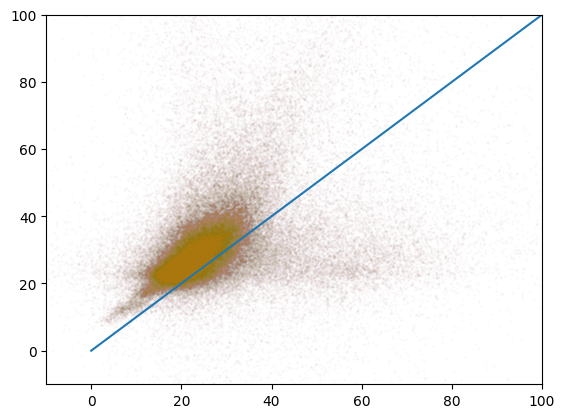

In [228]:
pl.scatter(av200356, av182212, alpha=0.01, s=1);
pl.scatter(av200356[~magerr_gtpt05], av182212[~magerr_gtpt05], alpha=0.01, s=1);
pl.plot([0,100],[0,100]);
pl.axis([-10,100,-10,100]);

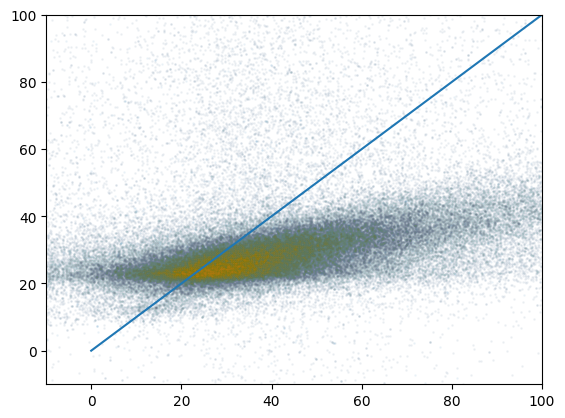

In [231]:
pl.scatter(av356444, av182212, alpha=0.05, s=1);
pl.scatter(av356444[~magerr_gtpt05], av182212[~magerr_gtpt05], alpha=0.01, s=1);
pl.plot([0,100],[0,100]);
pl.axis([-10,100,-10,100]);

### Why is there a group of stars with excess av356444?

Maybe water ice absorption?  Or CO2 ice absorption in 444?

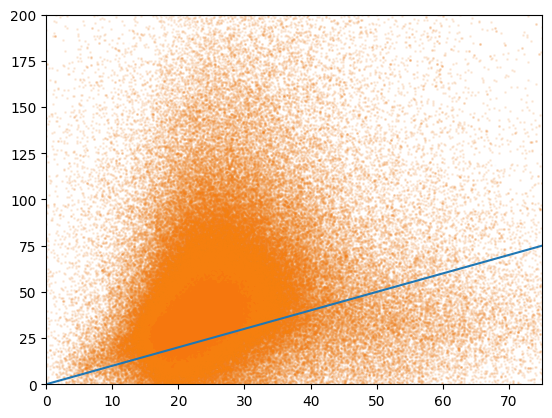

In [232]:
pl.scatter(av200356, av356444, alpha=0.01, s=1);
pl.scatter(av200356[~magerr_gtpt05], av356444[~magerr_gtpt05], alpha=0.1, s=1);
pl.plot([0,100],[0,100]);
pl.axis([0,75,0,200]);

In [197]:
import plot_tools

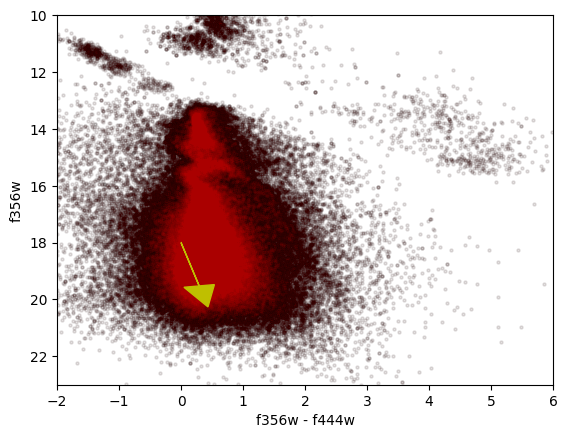

<Figure size 640x480 with 0 Axes>

In [233]:
plot_tools.cmds(basetable, colors=[('f356w', 'f444w')], axlims=(-2, 6, 23, 10),
                sel=~magerr_gtpt05, exclude=np.zeros(len(basetable), dtype='bool'),
                alpha=0.1, alpha_sel=0.01);

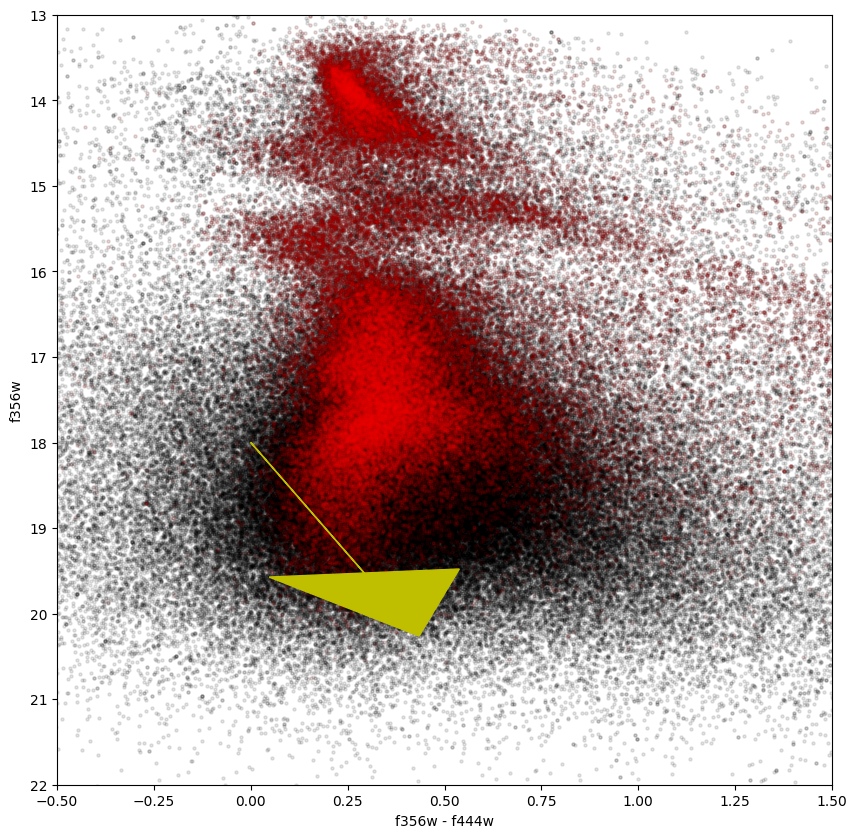

<Figure size 640x480 with 0 Axes>

In [252]:
# zoom in...
fig = pl.figure(figsize=(10,10))
sel = (~basetable['near_saturated_f444w_f444w'] &
       ~basetable['near_saturated_f356w_f356w'] &
       (~magerr_gtpt05) &
       ~(basetable['emag_ab_f356w'] > 0.05) &
       ~(basetable['emag_ab_f444w'] > 0.05))

plot_tools.cmds(basetable, colors=[('f356w', 'f444w')], axlims=(-0.5, 1.5, 22, 13),
                fig=fig,
                sel=sel,
                exclude=np.zeros(len(basetable), dtype='bool'),
                alpha=0.1, alpha_sel=0.05);

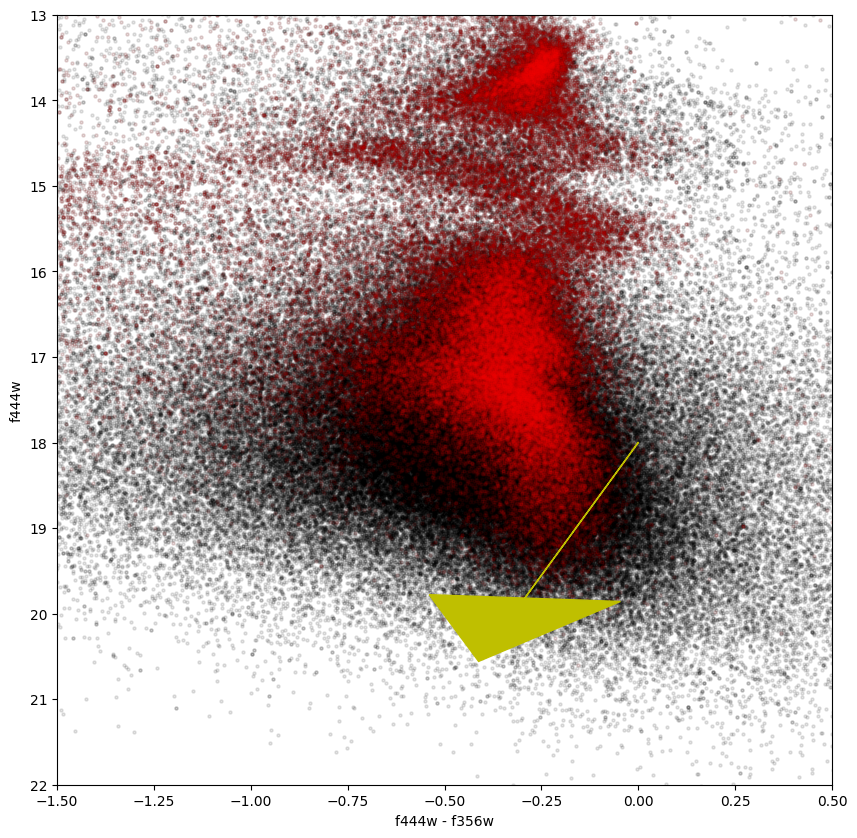

<Figure size 640x480 with 0 Axes>

In [249]:
# zoom in... and flip so 444 is on y-axis
fig = pl.figure(figsize=(10,10))
plot_tools.cmds(basetable, colors=[('f444w', 'f356w')], axlims=(-1.5, 0.5, 22, 13),
                fig=fig,
                sel=(~magerr_gtpt05) & ~(basetable['emag_ab_f356w'] > 0.05) & ~(basetable['emag_ab_f444w'] > 0.05),
                exclude=np.zeros(len(basetable), dtype='bool'),
                alpha=0.1, alpha_sel=0.05);

# diagnostic: What is the weird stuff happening between 14.5 and 15.5 mag?

Text(0.5, 1.0, 'Not the background, at least not obviously')

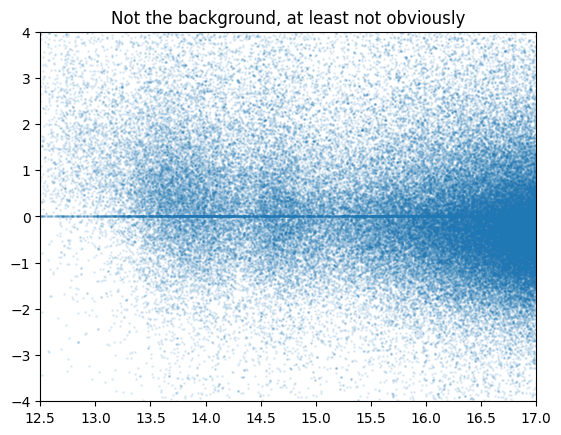

In [259]:
pl.scatter(basetable['mag_ab_f444w'], basetable['local_bkg_f444w'], s=1, alpha=0.1)
#pl.semilogy();
pl.ylim(-4, 4);
pl.xlim(12.5, 17);
pl.title("Not the background, at least not obviously")

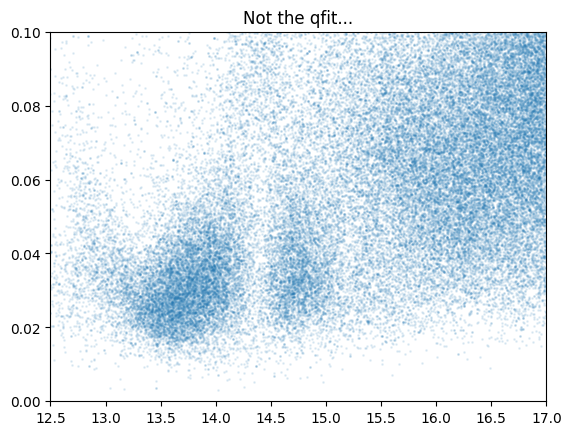

In [262]:
pl.scatter(basetable['mag_ab_f444w'], basetable['qfit_f444w'], s=1, alpha=0.1)
#pl.semilogy();
pl.ylim(0, 0.1);
pl.xlim(12.5, 17);
pl.title("Not the qfit...");

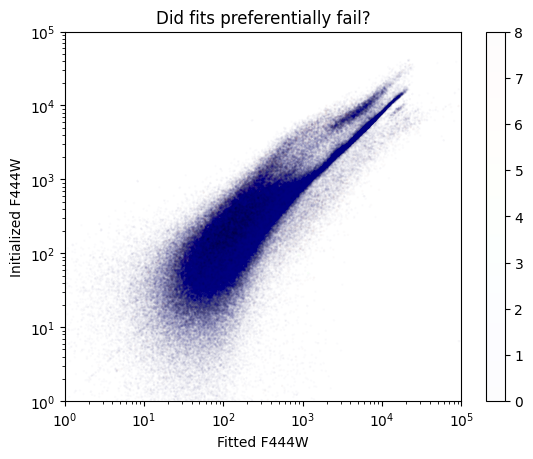

In [280]:
pl.scatter(basetable['flux_f444w'], basetable['flux_init_f444w'], s=1, alpha=0.01, c=basetable['flags_f444w'],
           vmin=0, vmax=8, cmap=pl.cm.jet)
pl.loglog();
pl.axis([1,1e5,1,1e5]);
#pl.colorbar();
pl.xlabel("Fitted F444W")
pl.ylabel("Initialized F444W")
pl.title("Did fits preferentially fail?");

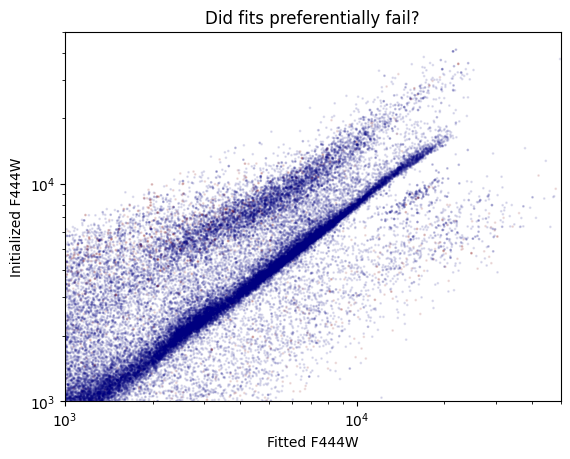

In [282]:
pl.scatter(basetable['flux_f444w'], basetable['flux_init_f444w'], s=1, alpha=0.1, c=basetable['flags_f444w'],
           vmin=0, vmax=8, cmap=pl.cm.jet)
pl.loglog();
pl.axis([1e3,5e4,1e3,5e4]);
pl.xlabel("Fitted F444W")
pl.ylabel("Initialized F444W")
pl.title("Did fits preferentially fail?");

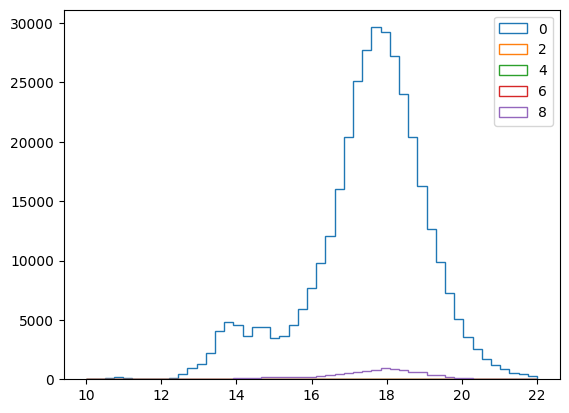

In [290]:
for flag in (0, 2, 4, 6, 8):
    pl.hist(basetable['mag_ab_f444w'][basetable['flags_f444w'] == flag], label=flag, histtype='step',
            bins=np.linspace(10, 22),
            #density=True,
           )
pl.legend(loc='best')

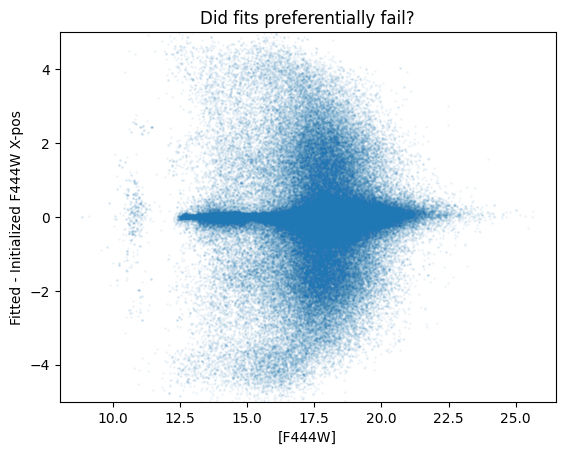

In [296]:
pl.scatter(basetable['mag_ab_f444w'],
           basetable['x_init_f444w'] - basetable['x_fit_f444w'], s=1, alpha=0.05,
           )
#pl.loglog();
#pl.axis([1e3,5e4,1e3,5e4]);
pl.ylim(-5, 5);
pl.xlabel("[F444W]")
pl.ylabel("Fitted - Initialized F444W X-pos")
pl.title("Did fits preferentially fail?");

In [263]:
[x for x in basetable.colnames if '444' in x]

['sep_f444w',
 'id_f444w_1',
 'skycoord_centroid_f444w',
 'skycoord_f444w',
 'id_f444w_2',
 'group_id_f444w',
 'group_size_f444w',
 'local_bkg_f444w',
 'x_init_f444w',
 'y_init_f444w',
 'flux_init_f444w',
 'x_fit_f444w',
 'y_fit_f444w',
 'flux_f444w',
 'x_err_f444w',
 'y_err_f444w',
 'flux_err_f444w',
 'npixfit_f444w',
 'qfit_f444w',
 'cfit_f444w',
 'flags_f444w',
 'mask_f444w',
 'flux_jy_f444w',
 'mag_ab_f444w',
 'eflux_jy_f444w',
 'emag_ab_f444w',
 'near_saturated_f444w_f444w',
 'replaced_saturated_f444w',
 'good_f444w']

## Extinction Contour Maps for 356-444

Matched 44492


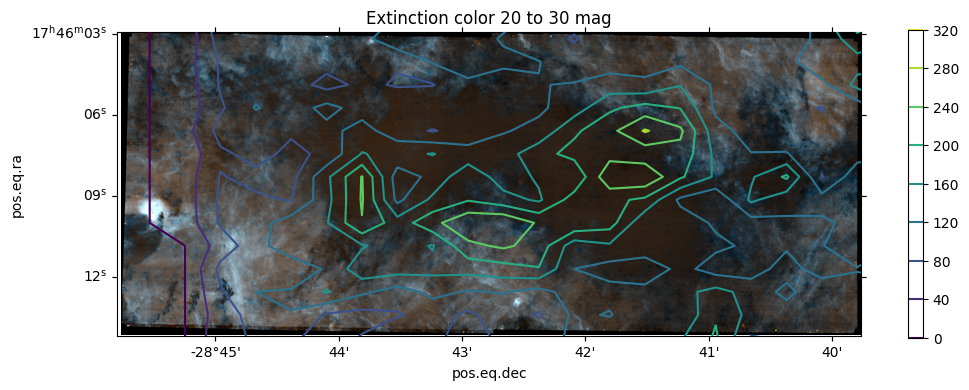

In [234]:
extinction_contour_plot(20, 30, extcolor=av356444, sel=~magerr_gtpt05_all)

Matched 52228


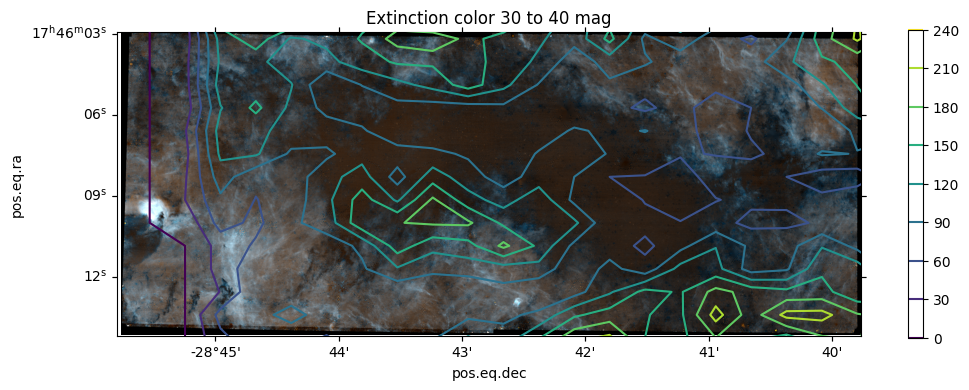

In [235]:
extinction_contour_plot(30, 40, extcolor=av356444, sel=~magerr_gtpt05_all)

Matched 100525


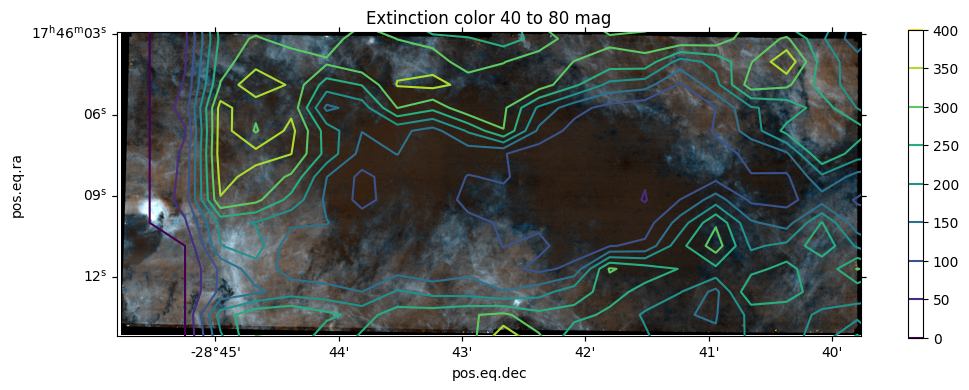

In [236]:
extinction_contour_plot(40, 80, extcolor=av356444, sel=~magerr_gtpt05_all)

Matched 25149


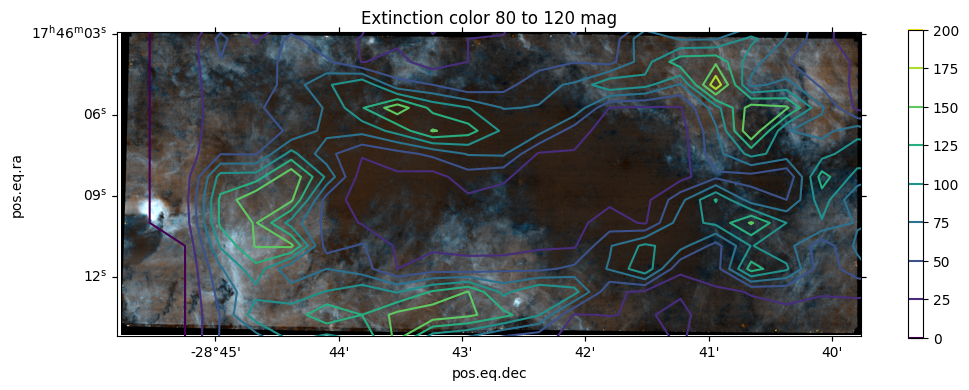

In [237]:
extinction_contour_plot(80, 120, extcolor=av356444, sel=~magerr_gtpt05_all)

Matched 9387


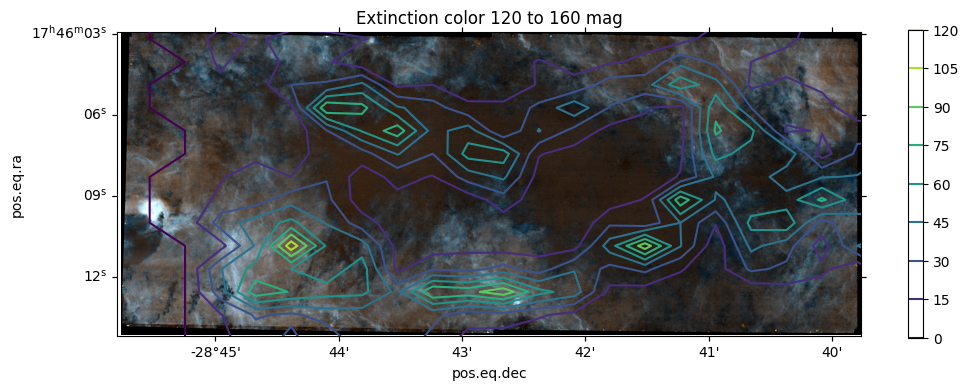

In [238]:
extinction_contour_plot(120, 160, extcolor=av356444, sel=~magerr_gtpt05_all)

# Where are the extincted sources?

If we assume F212N-F410M (really 410-405) color is dominated by extinction, which seems like a good first assumption, where are the stars of different extinction?

Check this by making density plots of different magnitude cuts.

In [202]:
# not sure these are legitimately bad?
# Feb 11, 2023: these are the same objects as 'weird blue' above
badblue = blue_410_466 & ( ((basetable['mag_ab_f405n'] - basetable['mag_ab_f410m']) > 2) |
                          ((basetable['mag_ab_f410m'] - basetable['mag_ab_f466n']) > -1) )
badblue.sum()

276

In [203]:
sel = ~any_saturated & ~badblue & oksep & (~magerr_gtpt1)
# this is what I had before but that's comparing to the BrA ... extcolor = basetable['mag_ab_f212n'] - basetable['mag_ab_405m410']
extcolor = basetable['mag_ab_f212n'] - basetable['mag_ab_410m405']

#crds[sel & (extcolor>0) & (extcolor<0.5)]

(array([3.0000e+00, 2.0000e+00, 1.2000e+01, 9.2000e+01, 3.8100e+02,
        2.9114e+04, 8.8758e+04, 9.0620e+03, 9.5100e+02, 9.4000e+01]),
 array([-8.13141741, -6.5924886 , -5.0535598 , -3.51463099, -1.97570218,
        -0.43677338,  1.10215543,  2.64108424,  4.18001304,  5.71894185,
         7.25787066]),
 <BarContainer object of 10 artists>)

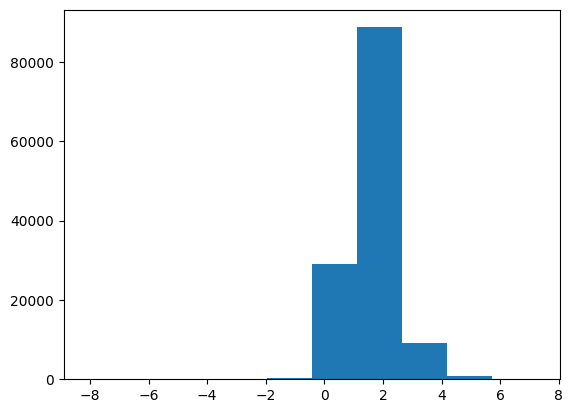

In [204]:
#pl.hist(basetable['mag_ab_405m410'])
#pl.hist(basetable['mag_ab_f212n'])
pl.hist(extcolor[np.isfinite(extcolor)])

Matched 2603


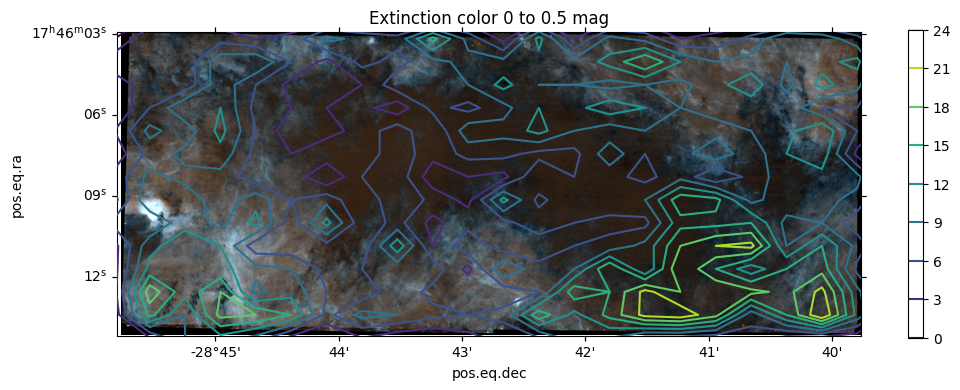

In [205]:
extinction_contour_plot(0, 0.5)

Matched 16816


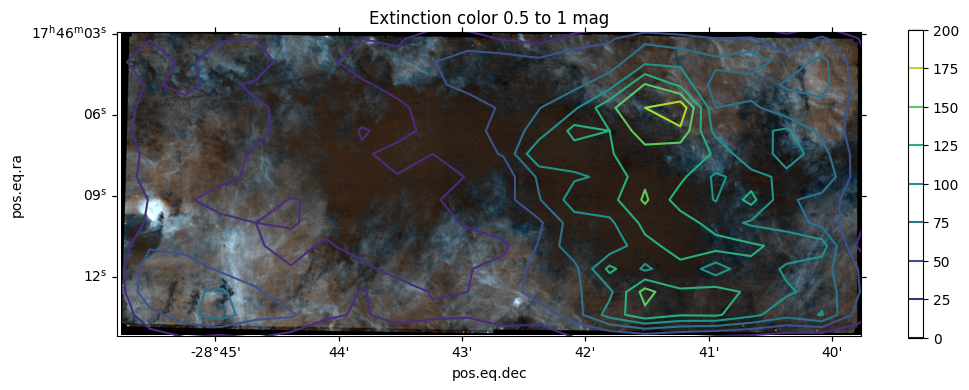

In [206]:
extinction_contour_plot(0.5, 1)

Matched 48123


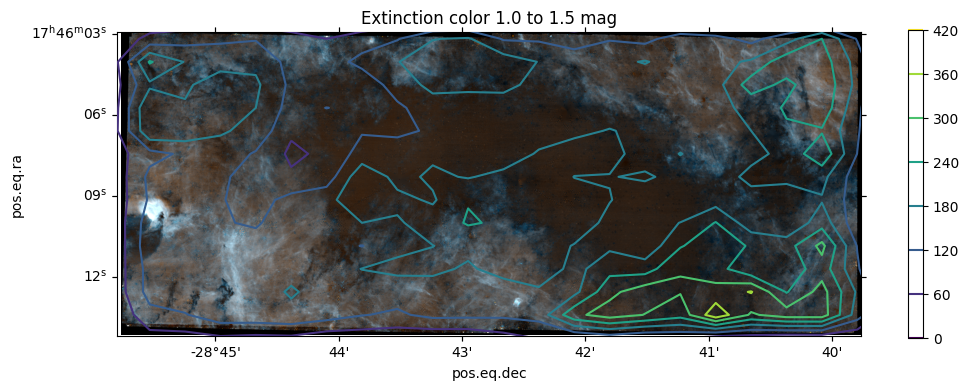

In [207]:
extinction_contour_plot(1.0, 1.5)

Matched 33314


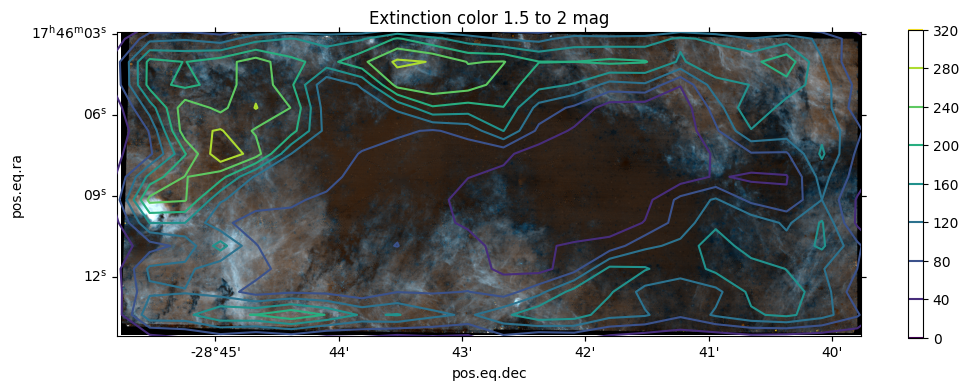

In [208]:
extinction_contour_plot(1.5, 2)

Matched 26668


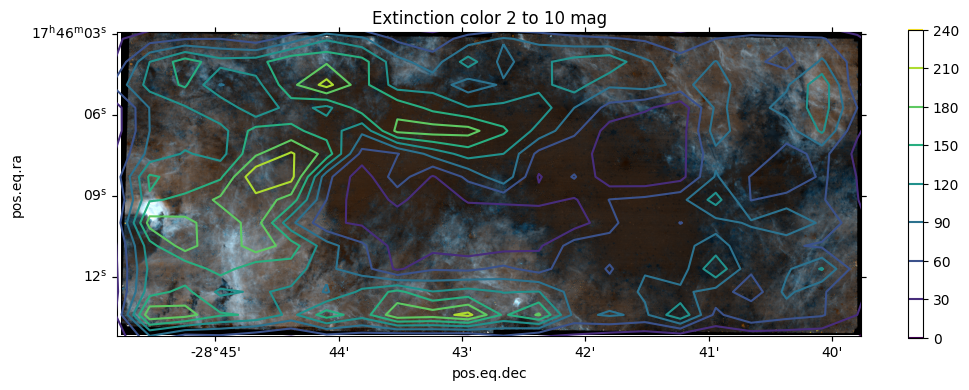

In [209]:
extinction_contour_plot(2, 10)

Matched 6363


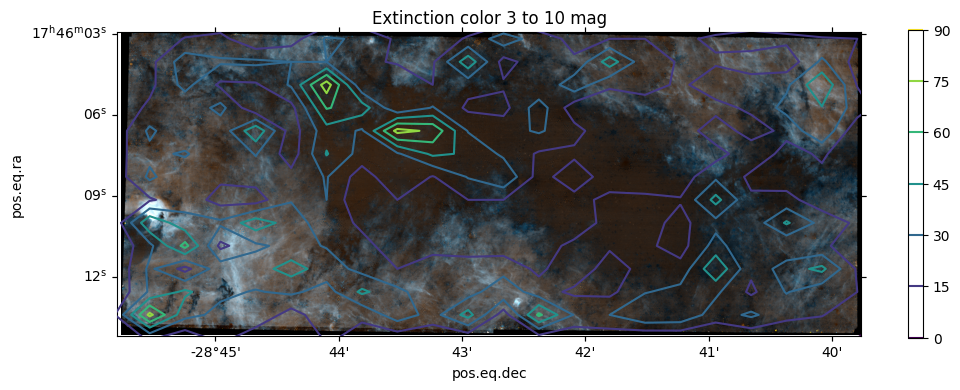

In [210]:
extinction_contour_plot(3, 10)

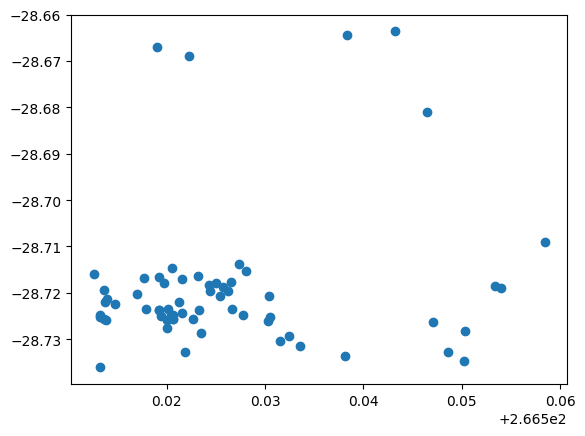

In [211]:
s1 = sel & (extcolor>4) & (extcolor<10)
xx = np.linspace(crds.ra.min(), crds.ra.max(), 25).value
yy = np.linspace(crds.dec.min(), crds.dec.max(), 25).value
zz, xe, ye = np.histogram2d(crds[s1].ra.value, crds[s1].dec.value, bins=[xx, yy])
cx = (xx[1:]+xx[:-1])/2
cy = (yy[1:]+yy[:-1])/2
pl.scatter(crds[s1].ra.deg, crds[s1].dec.deg)
#pl.contour(cx, cy, zz);
#pl.colorbar();

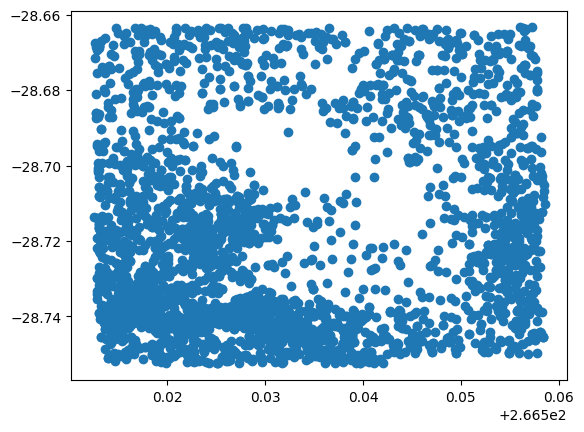

In [212]:
s1 = sel & (extcolor>2) & (extcolor<4)
xx = np.linspace(crds.ra.min(), crds.ra.max(), 25).value
yy = np.linspace(crds.dec.min(), crds.dec.max(), 25).value
zz, xe, ye = np.histogram2d(crds[s1].ra.value, crds[s1].dec.value, bins=[xx, yy])
cx = (xx[1:]+xx[:-1])/2
cy = (yy[1:]+yy[:-1])/2
pl.scatter(crds[s1].ra.deg, crds[s1].dec.deg)
#pl.contour(cx, cy, zz);
#pl.colorbar();

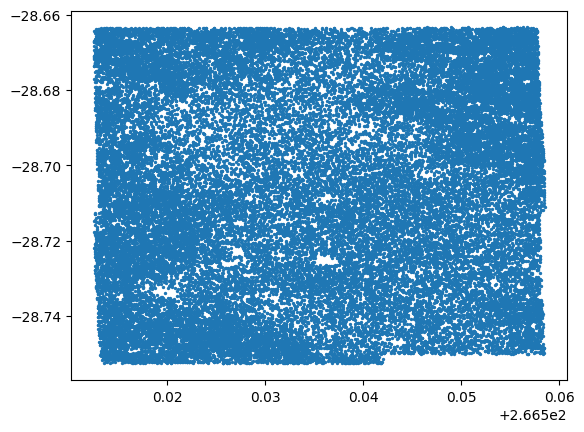

In [213]:
s1 = sel & (extcolor>1) & (extcolor<2)
xx = np.linspace(crds.ra.min(), crds.ra.max(), 25).value
yy = np.linspace(crds.dec.min(), crds.dec.max(), 25).value
zz, xe, ye = np.histogram2d(crds[s1].ra.value, crds[s1].dec.value, bins=[xx, yy])
cx = (xx[1:]+xx[:-1])/2
cy = (yy[1:]+yy[:-1])/2
pl.scatter(crds[s1].ra.deg, crds[s1].dec.deg, s=2)
#pl.contour(cx, cy, zz);
#pl.colorbar();

In [214]:
# "high extinction" stars (extcolor > 3)


avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png')
img_narrow = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png'))[::-1,:,:]
#wwi_bra_410 = avm.to_wcs(use_full_header=True)
wwi_narrow = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_narrow = img_narrow.swapaxes(0,1)
wwi_narrow = wwi_narrow.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_narrow)
ax.imshow(img_narrow)

crds = basetable['skycoord_f410m']
ax.scatter(
    crds.dec[~magerr_gtpt1 & oksep & ~any_saturated & ~badblue & (extcolor > 3) & ~extcolor.mask],
    crds.ra[~magerr_gtpt1 & oksep & ~any_saturated & ~badblue & (extcolor > 3) & ~extcolor.mask],
    transform=ax.get_transform('world'),
    s=2,
    marker='x',
    facecolors=(0.2, 1, 0.6),
    #markeredgewidth=0.5,
    # for non-x facecolors='none'
    #edgecolors=(0.3, 0.5, 0.8), 
);
ax.scatter(
    crds.dec[(~magerr_gtpt1) & oksep & (~any_saturated) & (~badblue) & (extcolor > 7) & ~extcolor.mask],
    crds.ra[(~magerr_gtpt1) & oksep & (~any_saturated) & (~badblue) & (extcolor > 7) & ~extcolor.mask],
    transform=ax.get_transform('world'),
    s=2,
    marker='x',
    facecolors=(1, 0.2, 0.1),
    #markeredgewidth=0.5,
    # for non-x facecolors='none'
    #edgecolors=(0.3, 0.5, 0.8), 
);
#ax.scatter(crds.ra[blue_410_405], crds.dec[blue_410_405], edgecolors='orange', facecolors='none', transform=ax.get_transform('world'))
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
# fig.savefig(f"{basepath}/images/ExtinctedStars_on_RGB.png", bbox_inches='tight')

FileNotFoundError: [Errno 2] No such file or directory: '/blue/adamginsburg/adamginsburg/jwst/brick//images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png'

In [ ]:
(extcolor > 12).sum()

In [ ]:
extcolor[(~magerr_gtpt1) & oksep & (~any_saturated) & (~badblue) & (extcolor > 12)].mask

In [ ]:
basetable['mag_ab_405m410'].mask.sum()

In [ ]:
(basetable['sep_f212n'] > 0.1*u.arcsec).sum()

In [ ]:
avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png')
img_narrow = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png'))[::-1,:,:]
#wwi_bra_410 = avm.to_wcs(use_full_header=True)
wwi_narrow = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_narrow = img_narrow.swapaxes(0,1)
wwi_narrow = wwi_narrow.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_narrow)
ax.imshow(img_narrow)

crds = basetable['skycoord_f410m']

# expanded sample
#oksep = np.logical_or.reduce([basetable[f'sep_{filtername}'] for filtername in filternames[1:]])
blue_410_466_incl = (~any_saturated &
                     ((basetable['mag_ab_410m405'] - basetable['mag_ab_f466n']) +
                      (basetable['emag_ab_f410m']**2 + basetable['emag_ab_f466n']**2 + basetable['emag_ab_f405n']**2)**0.5 < -1.75))
thissel = (~magerr_gtpt1 & oksep & ~any_saturated & ~badblue &
           ~basetable['mag_ab_410m405'].mask &
           blue_410_466_incl &
           (basetable['sep_f212n'] > 0.1*u.arcsec))

ax.scatter(
    crds.dec[thissel],
    crds.ra[thissel],
    transform=ax.get_transform('world'),
    s=2,
    marker='x',
    facecolors=(0.2, 1, 0.6),
    #markeredgewidth=0.5,
    # for non-x facecolors='none'
    #edgecolors=(0.3, 0.5, 0.8), 
);

#ax.scatter(crds.ra[blue_410_405], crds.dec[blue_410_405], edgecolors='orange', facecolors='none', transform=ax.get_transform('world'))
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
pl.title("Blue F410M-F466N stars")
# fig.savefig(f"{basepath}/images/ExtinctedStars_on_RGB.png", bbox_inches='tight')

In [ ]:
# This image shows only H-alpha stars
avm = pyavm.AVM.from_image(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png')
img_narrow = np.array(PIL.Image.open(f'{basepath}/images/BrickJWST_nrca_longwave_narrowband_rotated_lighter.png'))[::-1,:,:]
#wwi_bra_410 = avm.to_wcs(use_full_header=True)
wwi_narrow = wcs.WCS(fits.Header.fromstring(avm.Spatial.FITSheader))

img_narrow = img_narrow.swapaxes(0,1)
wwi_narrow = wwi_narrow.sub([2,1])

fig = pl.figure(figsize=(12,12))
ax = pl.subplot(projection=wwi_narrow)
ax.imshow(img_narrow)

crds = basetable['skycoord_f410m']

# expanded sample ("incl" for "inclusive")
#oksep = np.logical_or.reduce([basetable[f'sep_{filtername}'] for filtername in filternames[1:]])
blue_410_466_incl = (~any_saturated &
                     ((basetable['mag_ab_410m405'] - basetable['mag_ab_f466n']) +
                      (basetable['emag_ab_f410m']**2 + basetable['emag_ab_f466n']**2 + basetable['emag_ab_f405n']**2)**0.5 < -1.75))
thissel = (oksep & ~any_saturated & ~badblue &# ~magerr_gtpt1 &
           ~basetable['mag_ab_410m405'].mask &
           blue_410_466_incl)

ax.scatter(
    crds.dec[thissel],
    crds.ra[thissel],
    transform=ax.get_transform('world'),
    s=5,
    marker='x',
    facecolors=(0.2, 1, 0.6),
    #markeredgewidth=0.5,
    # for non-x facecolors='none'
    #edgecolors=(0.3, 0.5, 0.8), 
);

#ax.scatter(crds.ra[blue_410_405], crds.dec[blue_410_405], edgecolors='orange', facecolors='none', transform=ax.get_transform('world'))
ax.coords['ra'].set_axislabel('Right Ascension')
ax.coords['dec'].set_axislabel('Declination')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
lon.set_major_formatter('dd:mm:ss.ss')
lat.set_major_formatter('dd:mm:ss.ss')
#lon.set_ticks(spacing=30. * u.arcsec, color='red')
#lat.set_ticks(spacing=30. * u.arcsec, color='blue')
#lon.set_ticklabel(color='red')
#lat.set_ticklabel(color='blue')
#lon.grid(color='red')
#lat.grid(color='blue')

dec.set_ticks_position('l')
dec.set_ticklabel_position('l')
dec.set_axislabel_position('l')
ra.set_ticks_position('b')
ra.set_ticklabel_position('b')
ra.set_axislabel_position('b')
pl.title("Blue F410M-F466N stars, but allowing for greater magnitude errors")
# fig.savefig(f"{basepath}/images/ExtinctedStars_on_RGB.png", bbox_inches='tight')